## Tune UMAP Algorithm

With the embedding generated in network_analysis notebook, this notebook aims at trying to tune UMAP to get better visualization.

### Data
1. [Les Misérables Network](http://konect.uni-koblenz.de/test/networks/moreno_lesmis).


### Reference
1. UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction, Leland McInnes, John Healy, James Melville, 2018. [Paper](https://arxiv.org/pdf/1802.03426.pdf). [Code](https://github.com/lmcinnes/umap). 
2. UMAP Documentation, Leland McInnes. [Doc](https://media.readthedocs.org/pdf/umap-learn/latest/umap-learn.pdf).

### Load Packages

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
from sklearn.cluster import KMeans
import umap

import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
sns.set_style("whitegrid")
palette = sns.diverging_palette(220, 20, sep = 20, n = 8)
sns.set_palette(palette)

In [2]:
import random
random.seed(246)        # or any integer
import numpy
numpy.random.seed(4812)

In [3]:
def get_sub_plot(title = '', width = 10, height = 6, label_font_size = 14, tick_font_size = 13):
    fig, ax = plt.subplots()
    fig.set_size_inches(width, height)
    ax.tick_params(labelsize = tick_font_size)
    ax.set_title(title)
    ax.set_xlabel(ax.get_xlabel(), fontsize = label_font_size)
    ax.set_ylabel(ax.get_ylabel(), fontsize = label_font_size)
    return ax

### Read Graph

In [4]:
graph_file = 'graph/les_miserables.edgelist'
G = nx.read_edgelist(graph_file, nodetype = int, data=(('weight', float),))
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 77
Number of edges: 254
Average degree:   6.5974


### Load Embedding

In [5]:
emb_file = 'emb/les_miserables.emb'

In [6]:
# load the embedding in numpy array
embs = np.loadtxt(emb_file, delimiter = " ", skiprows = 1)

In [7]:
# skip the first column since it's the node id
node_ids = [int(emb[0]) for emb in embs]
print(node_ids)

[11, 2, 56, 26, 59, 27, 49, 63, 28, 24, 65, 60, 4, 3, 50, 25, 52, 64, 66, 29, 70, 62, 36, 18, 19, 69, 20, 21, 23, 71, 42, 17, 30, 22, 58, 35, 37, 61, 39, 38, 76, 32, 67, 75, 74, 47, 72, 9, 55, 40, 77, 45, 10, 46, 44, 43, 31, 48, 34, 53, 6, 73, 7, 57, 68, 13, 1, 8, 51, 5, 16, 15, 54, 33, 41, 12, 14]


In [8]:
embs = np.array([emb[1:] for emb in embs])
print(embs)

[[ 0.0435967  -0.25456798  0.5205234  ...  0.62822944  0.01757852
  -0.26488674]
 [-0.37403914  0.818308    0.48558623 ...  0.5111419  -0.80856127
  -0.09572712]
 [ 0.05063136 -0.6151746   0.67042106 ...  0.12665151 -0.11806435
  -0.2502267 ]
 ...
 [-0.40731573 -0.56561816  0.33539143 ... -0.96927774 -0.22907783
  -0.16396947]
 [-0.1305599  -0.02021191  1.4815074  ...  0.3213249  -1.2362156
  -0.33379677]
 [ 0.8612385   0.20088528 -0.09251707 ...  0.37823537 -0.18499018
   0.3942587 ]]


### Visualize Embedding with UMAP, A Dimensionality Reduction Algorithm

Let's tune n_neighbors and min_dist first.

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


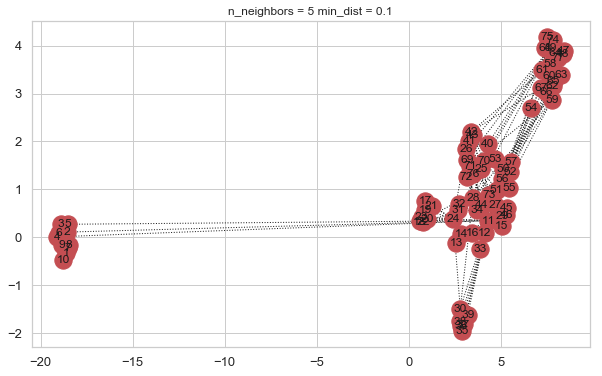

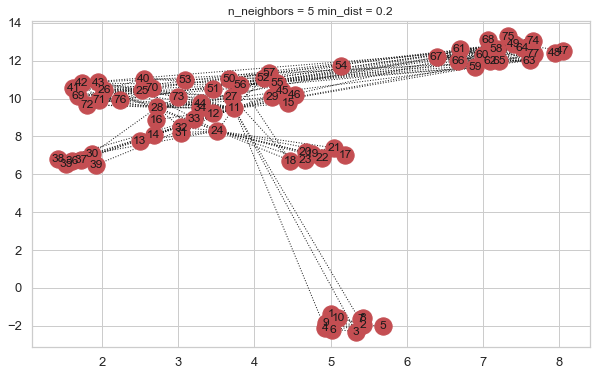

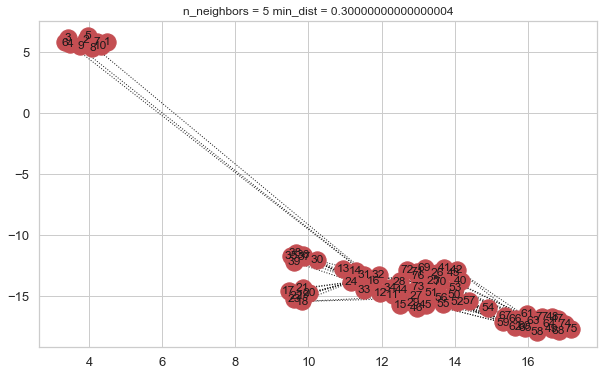

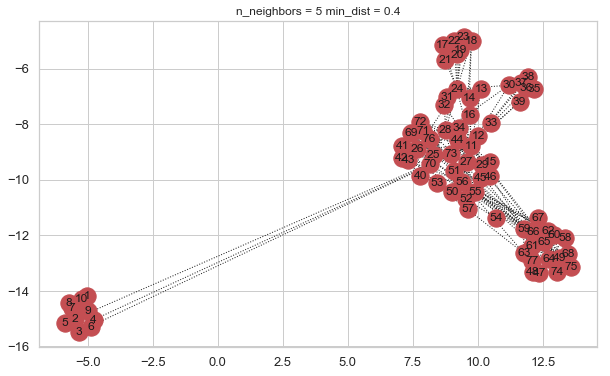

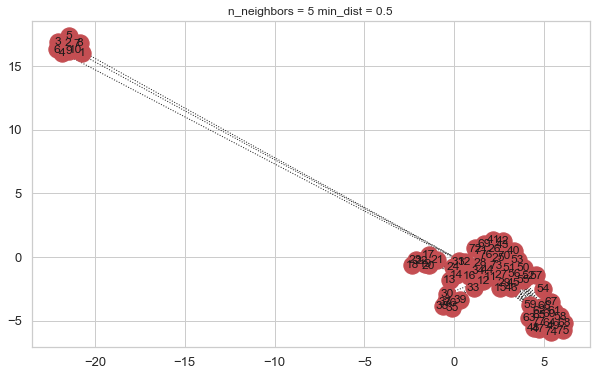

...

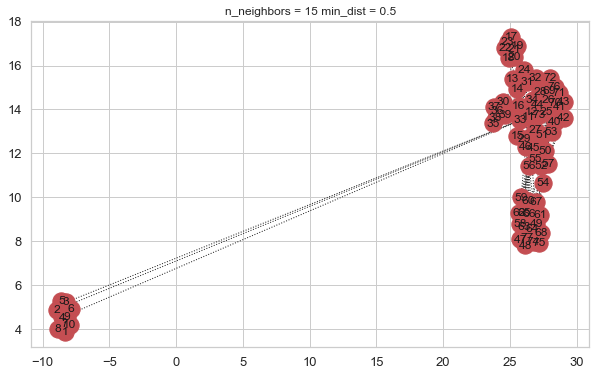

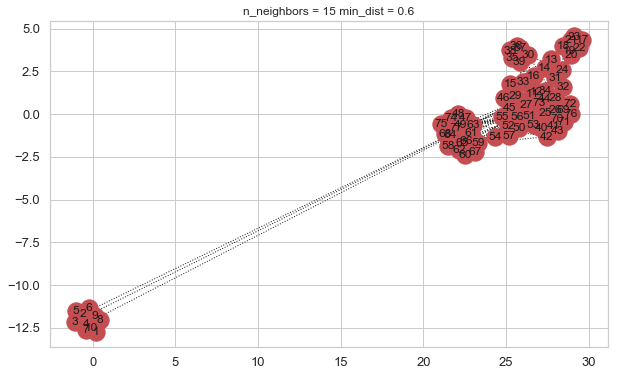

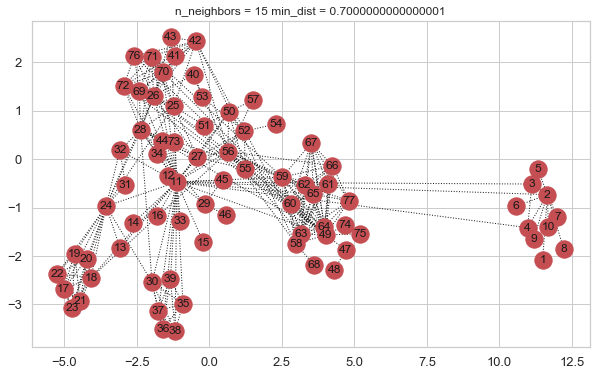

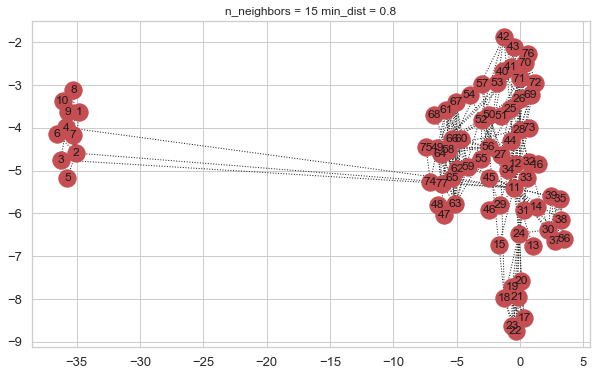

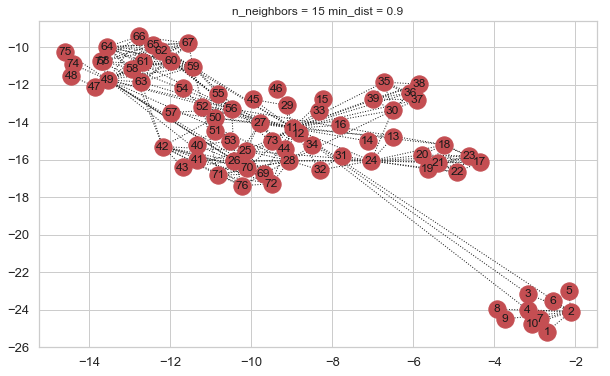

In [9]:
for n_neighbors in range(5, 20, 5):
    for min_dist in np.arange(0.1, 1.0, 0.1):
        reducer = umap.UMAP(n_components = 2,
                            min_dist = min_dist,
                            spread = 1.0,
                            metric = 'euclidean',
                            local_connectivity = 5,
                            n_neighbors = n_neighbors,
                            random_state = 42,
                            n_epochs = 1000,
                            verbose = False)

        reduced_embs = reducer.fit_transform(embs)

        df = pd.DataFrame({'node_id' : node_ids, 'reduced_x': reduced_embs[:, 0], 'reduced_y': reduced_embs[:, 1]})
        node2posMap = {}
        for index, row in df.iterrows():
            node2posMap[row['node_id']] = [row['reduced_x'], row['reduced_y']]
        ax = get_sub_plot(title = 'n_neighbors = ' + str(n_neighbors) + ' min_dist = ' + str(min_dist))
        nx.draw_networkx(G, pos = node2posMap, style = 'dotted', ax = ax)

Looks like min_dist 0.9 gives better visualization consistently since data points are spread out more.

Let's fix it to 0.9 and tune other hyper-parameters.

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


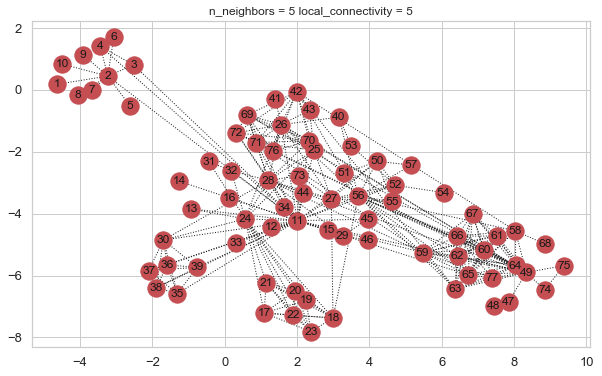

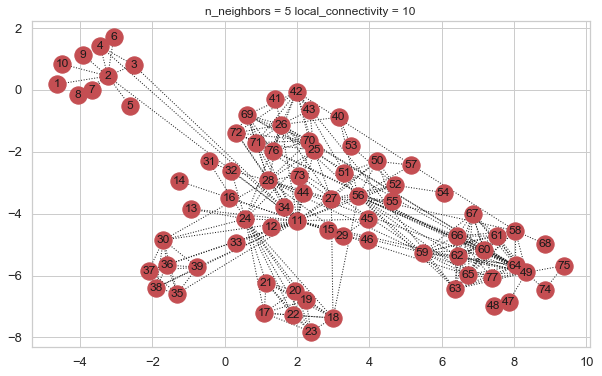

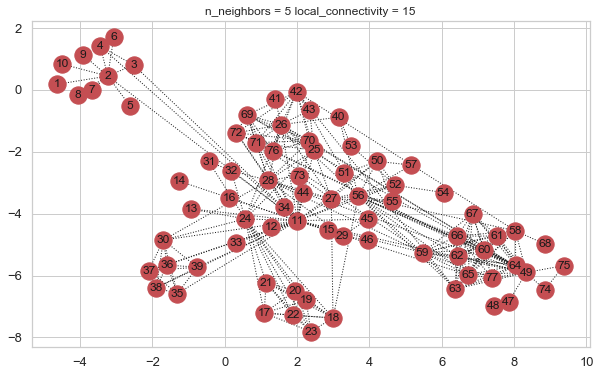

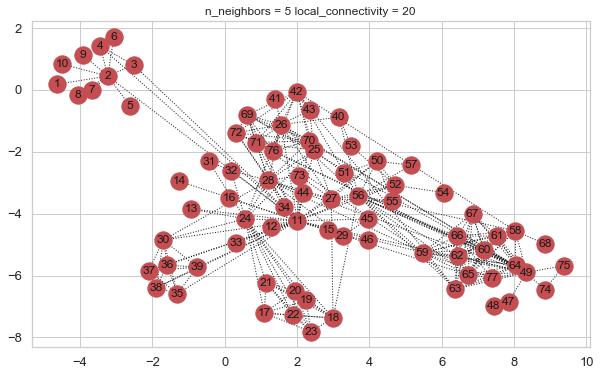

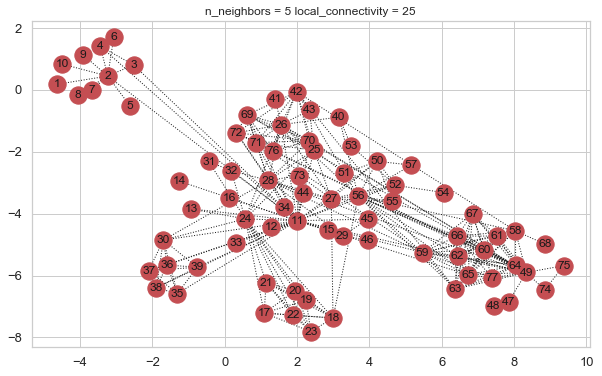

...

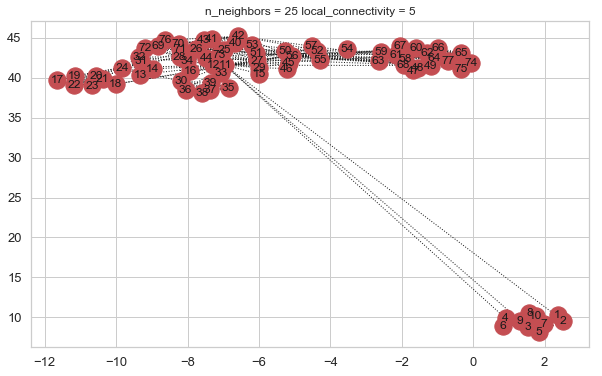

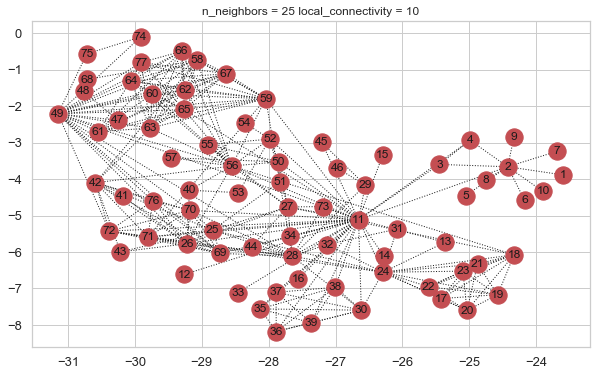

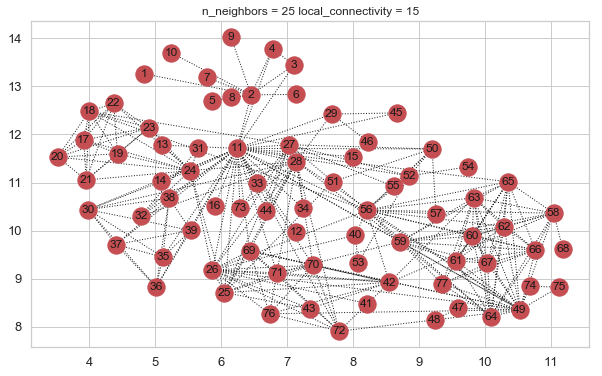

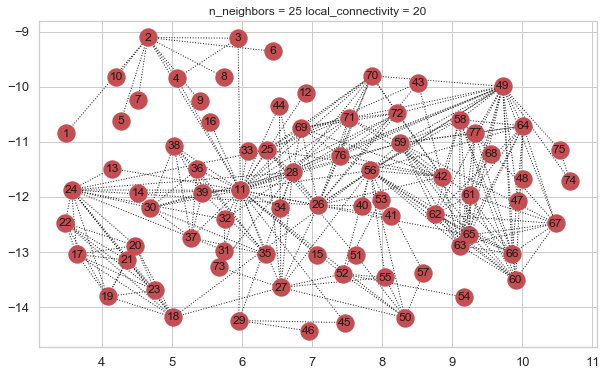

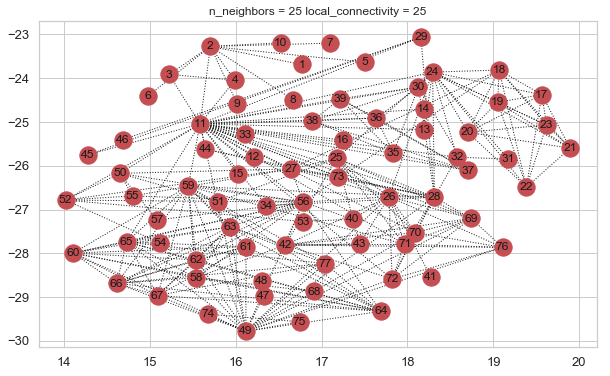

In [10]:
for n_neighbors in range(5, 30, 5):
    for local_connectivity in range(5, 30, 5):
        reducer = umap.UMAP(n_components = 2,
                            min_dist = 0.9,
                            spread = 1.0,
                            metric = 'euclidean',
                            local_connectivity = local_connectivity,
                            n_neighbors = n_neighbors,
                            random_state = 42,
                            n_epochs = 1000,
                            verbose = False)

        reduced_embs = reducer.fit_transform(embs)

        df = pd.DataFrame({'node_id' : node_ids, 'reduced_x': reduced_embs[:, 0], 'reduced_y': reduced_embs[:, 1]})
        node2posMap = {}
        for index, row in df.iterrows():
            node2posMap[row['node_id']] = [row['reduced_x'], row['reduced_y']]
        ax = get_sub_plot(title = 'n_neighbors = ' + str(n_neighbors) + ' local_connectivity = ' + str(local_connectivity))
        nx.draw_networkx(G, pos = node2posMap, style = 'dotted', ax = ax)

Seems not much different. n_neighbors 15 and local_connectivity 15 seem to be good.

Looks like with bigger number of n_neighbors and local_connectivity, data points are kind of spread out automatically since it needs to consider more local connectivities.

Let's re-tune min_dist:

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


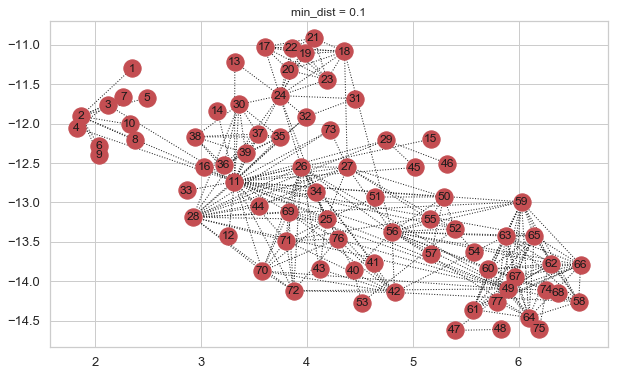

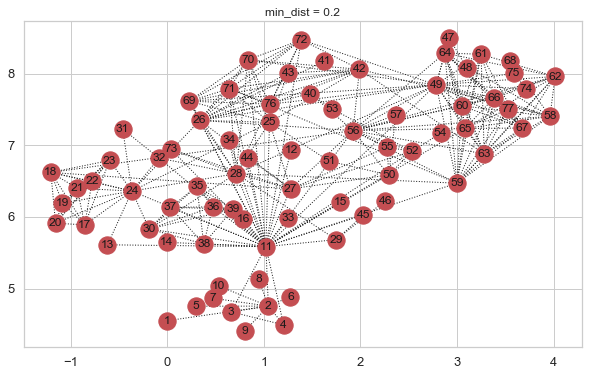

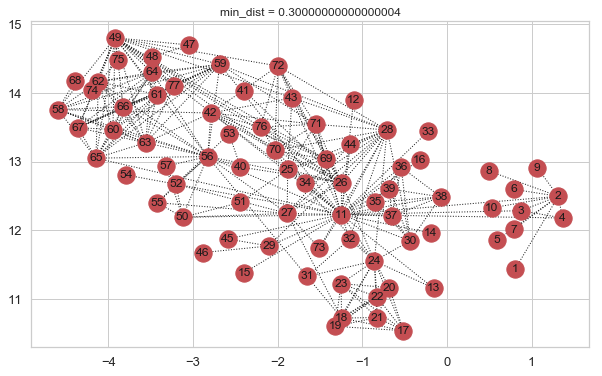

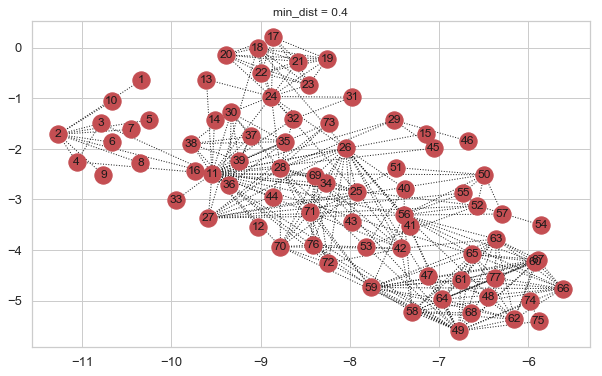

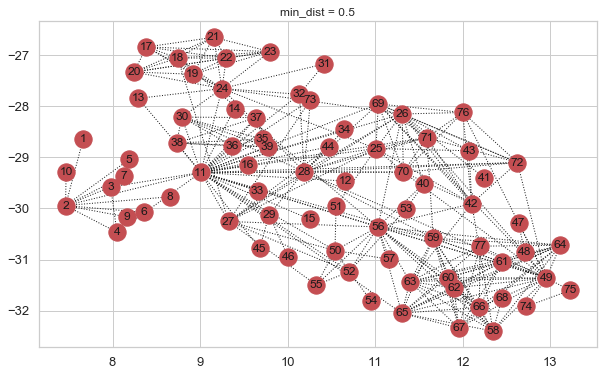

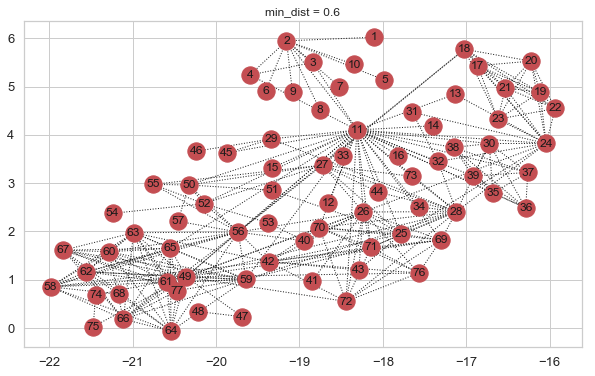

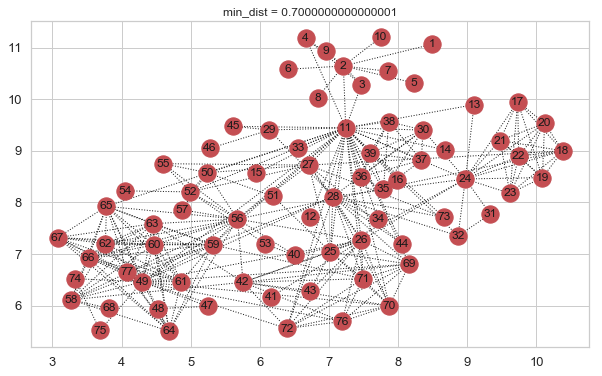

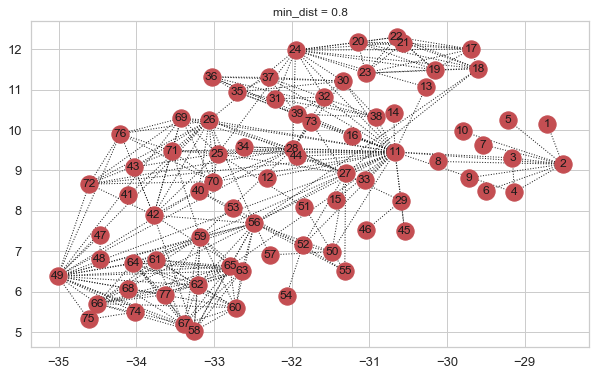

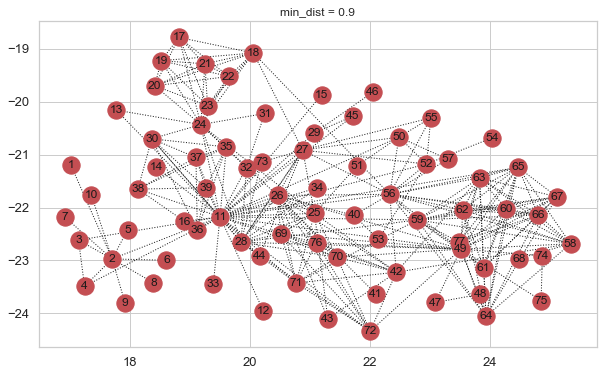

In [11]:
for min_dist in np.arange(0.1, 1.0, 0.1):
    reducer = umap.UMAP(n_components = 2,
                        min_dist = min_dist,
                        spread = 1.0,
                        metric = 'euclidean',
                        local_connectivity = 15,
                        n_neighbors = 15,
                        random_state = 42,
                        n_epochs = 1000,
                        verbose = False)

    reduced_embs = reducer.fit_transform(embs)

    df = pd.DataFrame({'node_id' : node_ids, 'reduced_x': reduced_embs[:, 0], 'reduced_y': reduced_embs[:, 1]})
    node2posMap = {}
    for index, row in df.iterrows():
        node2posMap[row['node_id']] = [row['reduced_x'], row['reduced_y']]
    ax = get_sub_plot(title = 'min_dist = ' + str(min_dist))
    nx.draw_networkx(G, pos = node2posMap, style = 'dotted', ax = ax)

min_dist 0.1 seems to be good enough.

Finally let's tune n_epochs:

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


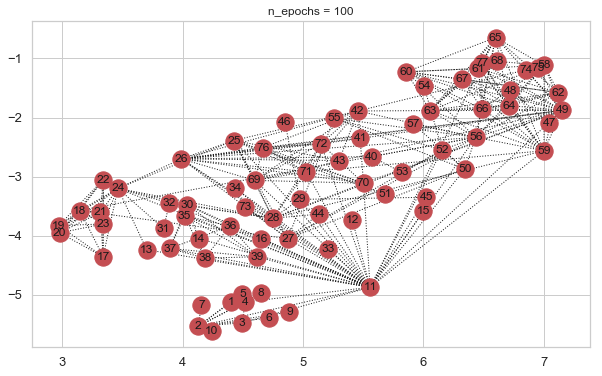

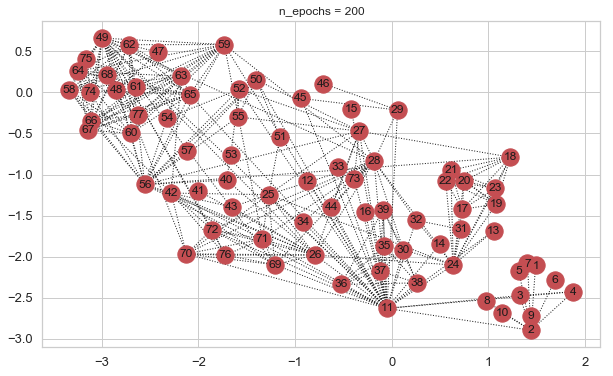

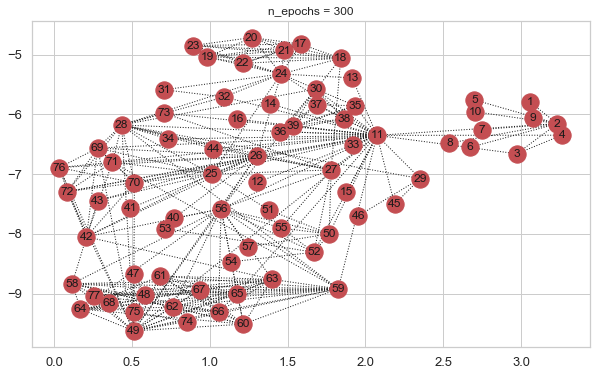

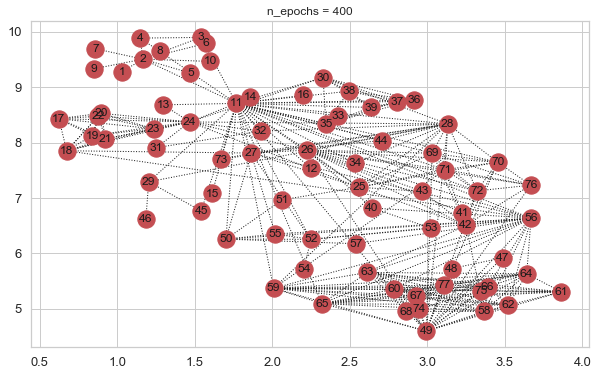

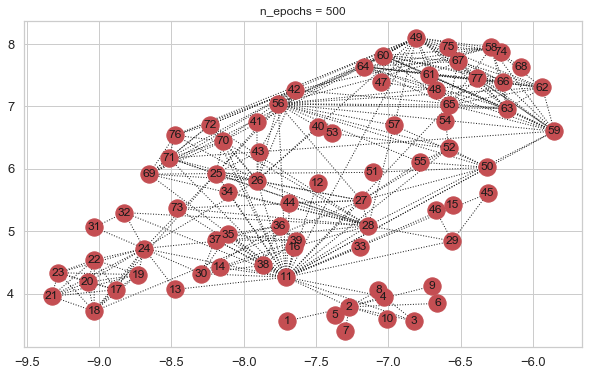

...

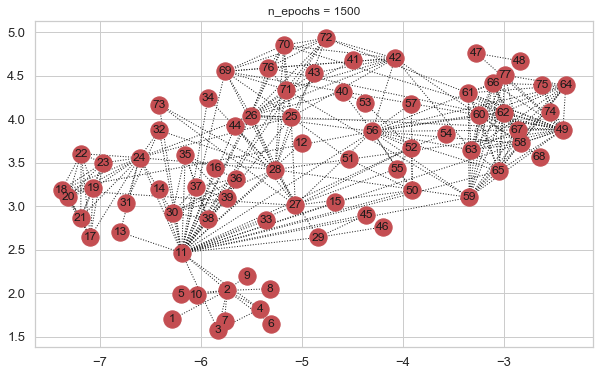

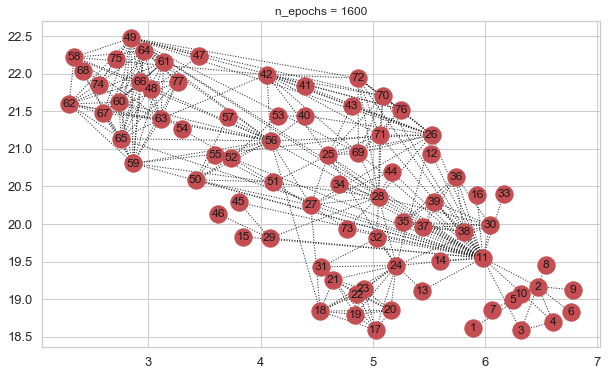

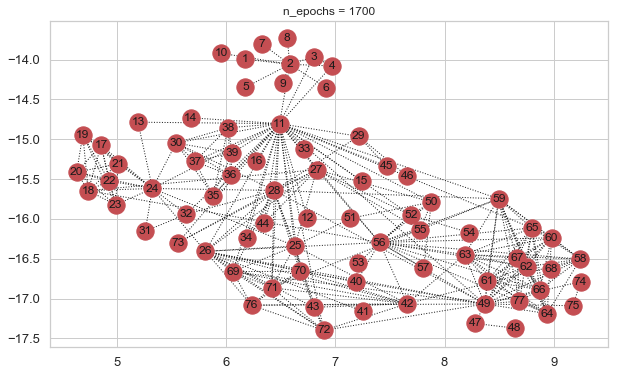

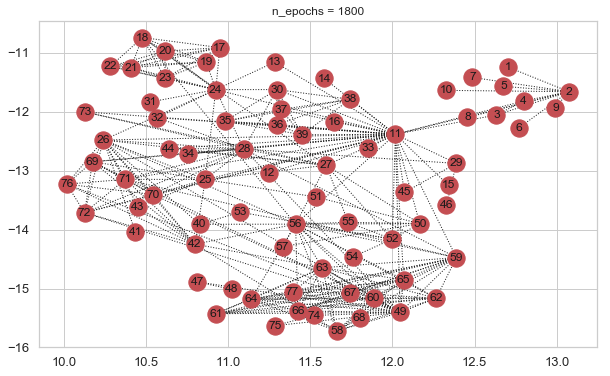

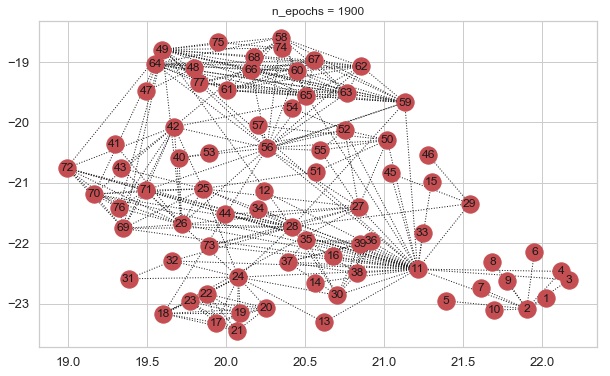

In [12]:
for n_epochs in range(100, 2000, 100):
    reducer = umap.UMAP(n_components = 2,
                        min_dist = 0.1,
                        spread = 1.0,
                        metric = 'euclidean',
                        local_connectivity = 15,
                        n_neighbors = 15,
                        random_state = 42,
                        n_epochs = n_epochs,
                        verbose = False)

    reduced_embs = reducer.fit_transform(embs)

    df = pd.DataFrame({'node_id' : node_ids, 'reduced_x': reduced_embs[:, 0], 'reduced_y': reduced_embs[:, 1]})
    node2posMap = {}
    for index, row in df.iterrows():
        node2posMap[row['node_id']] = [row['reduced_x'], row['reduced_y']]
    ax = get_sub_plot(title = 'n_epochs = ' + str(n_epochs))
    nx.draw_networkx(G, pos = node2posMap, style = 'dotted', ax = ax)

n_epochs greater or equal than 1000 seems to be better.

### Plot with Best Parameters

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


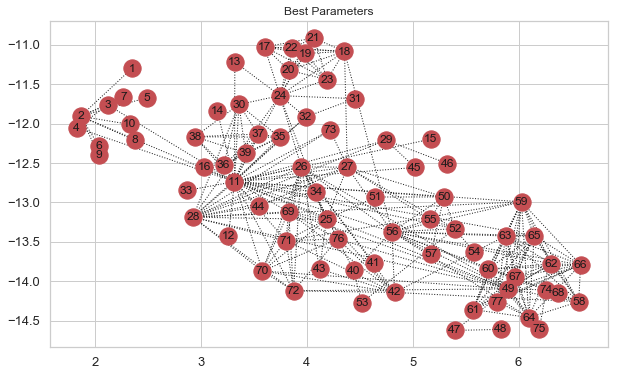

In [13]:
reducer = umap.UMAP(n_components = 2,
                    min_dist = 0.1,
                    spread = 1.0,
                    metric = 'euclidean',
                    local_connectivity = 15,
                    n_neighbors = 15,
                    random_state = 42,
                    n_epochs = 1000,
                    verbose = False)

reduced_embs = reducer.fit_transform(embs)

df = pd.DataFrame({'node_id' : node_ids, 'reduced_x': reduced_embs[:, 0], 'reduced_y': reduced_embs[:, 1]})

node2posMap = {}
for index, row in df.iterrows():
    node2posMap[row['node_id']] = [row['reduced_x'], row['reduced_y']]

ax = get_sub_plot(title = 'Best Parameters')
nx.draw_networkx(G, pos = node2posMap, style = 'dotted', ax = ax)

### Plot together with Cluster Information

/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


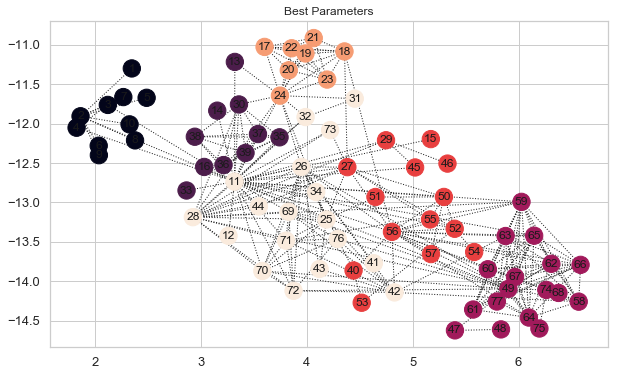

In [14]:
kmeans = KMeans(n_clusters = 6, n_init = 50, max_iter = 500, verbose = 0, random_state = 42).fit(embs)
df['cluster'] = kmeans.labels_

node2clusterMap = {}

for index, row in df.iterrows():
    node2clusterMap[row['node_id']] = row['cluster']

clusters = [node2clusterMap[node] for node in G.nodes()]

ax = get_sub_plot(title = 'Best Parameters')
nx.draw_networkx(G, pos = node2posMap, node_color = clusters, style = 'dotted', ax = ax)

Yes communities are clustered pretty well.

### Conclusion
With the above tuning, it seems that n_neighbors and local_connectivity should be tuned first based on the data points. Followed by that, min_dist and other parameters can be tried to achieve the best visualization.